In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


##Extract Pill dataset



In [ ]:
from tqdm import tqdm_notebook as tqdm
from zipfile import ZipFile
with ZipFile('DATASET_pill_update.zip') as zipfile:
     for memory in tqdm(zipfile.infolist(), desc='Extracting'):
         try:
             zipfile.extract(memory,'Data_update_2')
         except zipfile.error as e:
             pass

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.




##Import neccesary Libraries



In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
# Image processing
import matplotlib.pyplot as plt
import seaborn as sns
import imageio
import skimage
import skimage.io
import skimage.transform
from imageio import imread

from sklearn.metrics import classification_report ,confusion_matrix

from keras import optimizers
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.models import Sequential , Model
from keras.layers import Dense,GlobalAveragePooling2D,BatchNormalization,Dropout

from keras.layers.core import Activation , Flatten , Dropout ,Dense
from keras.models import Model
from keras.layers.normalization import BatchNormalization
from keras.applications import InceptionResNetV2 ,VGG16 ,Xception,ResNet50
from keras.callbacks import ModelCheckpoint, Callback, EarlyStopping, ReduceLROnPlateau

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm
Using TensorFlow backend.




>  รายชื่อของประเภทยา 28 ประเภท



In [ ]:
print(os.listdir('/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/train'))

##กำหนด Directory
directory=os.listdir('/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/train')

['Air-x80', 'Amlodipine', 'Betahistine', 'Betahistine12', 'Caltab', 'Celebrex', 'Cetirizine', 'Cinnarizine', 'Cyprohaptadine', 'Diclofinac', 'Diclofinac2', 'Dimenhydrinate', 'Domperidone', 'Dymoxin', 'Ibrofen', 'Ibrupofen', 'Ibrupofen2', 'Losartan', 'Methycobal', 'Metroclopramide', 'Nasotap', 'Norgesic', 'Nuosic', 'Omepazole', 'Pencilin', 'Tofago', 'Tolprisone', 'Torrent']


## preprocess

> crop image and resize ก่อนทำ Data augmentation



In [ ]:
import glob
import os
import cv2
from google.colab.patches import cv2_imshow

In [ ]:
def crop_image(img_path):
# load the image and show it
  image = cv2.imread(str(img_path))

# crop image after resize
  # channels height= 0 , width = 1 , channels = 2
  height, width, channels = image.shape
  upper_left = (int(width / 3), int(height / 3))
  bottom_right = (int(width * 3 / 4), int(height * 3 / 4))
	
# draw a rectangle in the image which will represent the ROI
# cv2.rectangle(image, start_point, end_point, color, thickness) 
  rectangle = cv2.rectangle(image, upper_left, bottom_right, (0, 255, 0), 2)
	
# indexing array
  cropped_img = image[upper_left[1]+2 : bottom_right[1]-1, upper_left[0]+2 : bottom_right[0]-1]
  cv2.imwrite(str(img_path), cropped_img)
  #cv2_imshow(rectangle)
  #cv2_imshow(cropped_img)
  #print(cropped_img.shape)

def resize(img_path):
  image_size = cv2.imread(str(img_path))
  resize_img =  cv2.resize(image_size,(224,224))
  write = cv2.imwrite(str(img_path), resize_img)
  cv2_imshow(resize_img)
  print(resize_img.shape)
  


> Input ของรูปจาก user มีขนาด 1280*1280 pixels

> ตัวอย่าง รูปภาพที่ทำการ preprocessing  โดยการสร้าง Bounding box แล้ว Crop ตามกรอบ Bounding Box ก่อนที่จะนำเข้าไป train model ซึ่งจะช่วยในการเพิ่มประสิทธิภาพในการทำนายของ Model



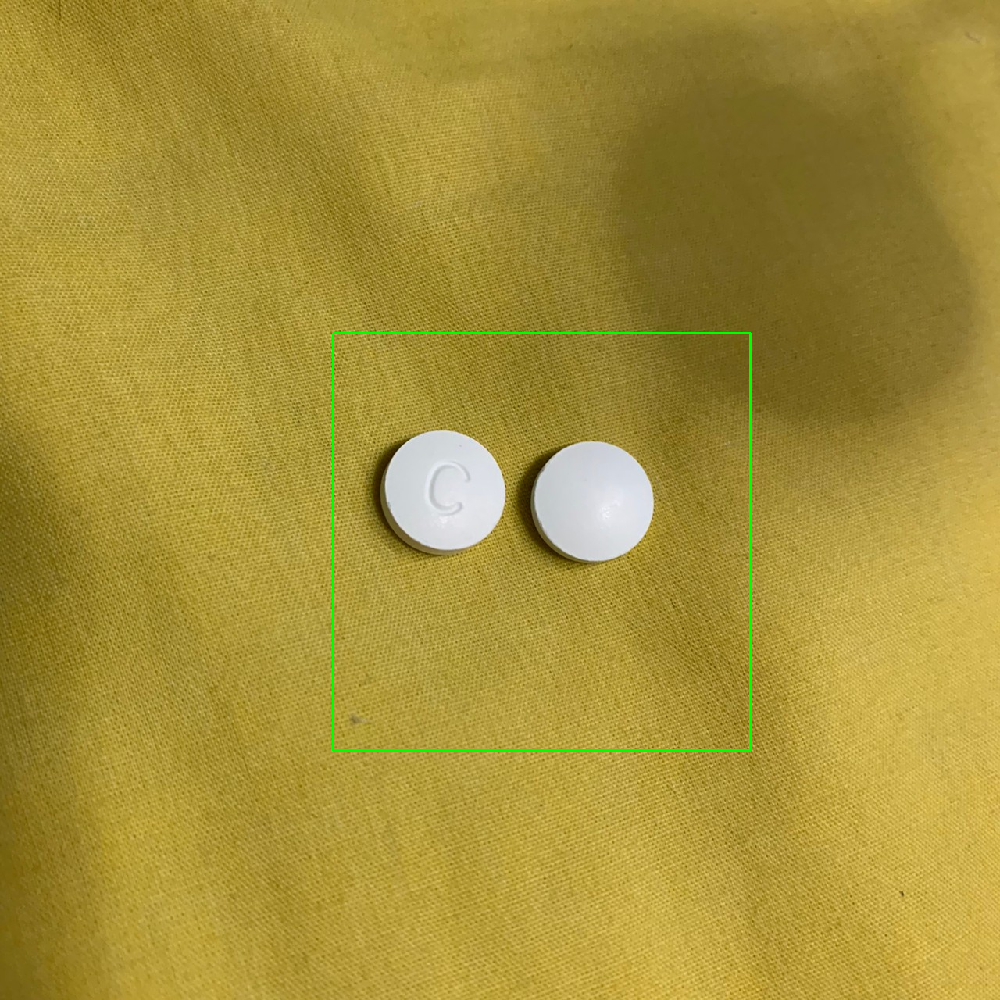

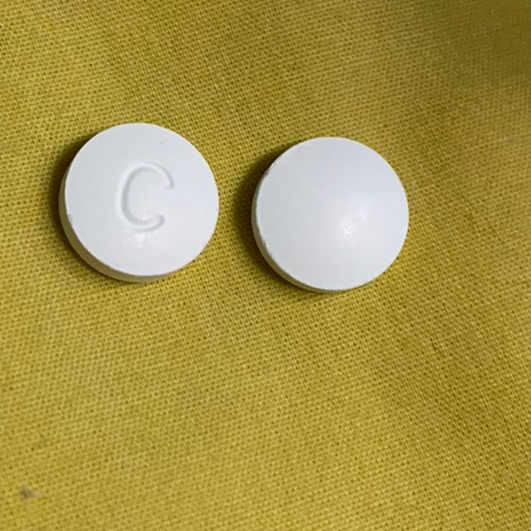

In [ ]:
crop_image('/content/drive/My Drive/IS/Dataset/รูปที่ใช้ show ตอน Preprocessing/Celtab_t2_200526_0005.jpg')

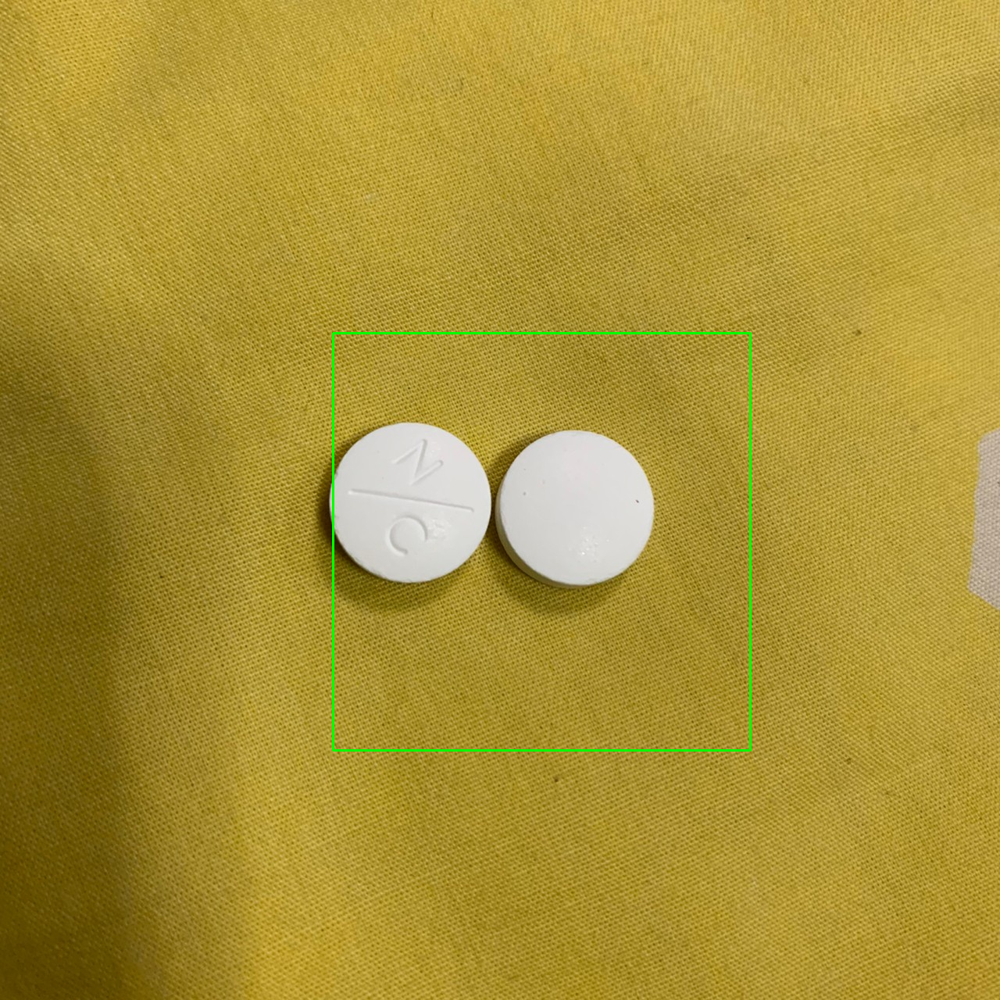

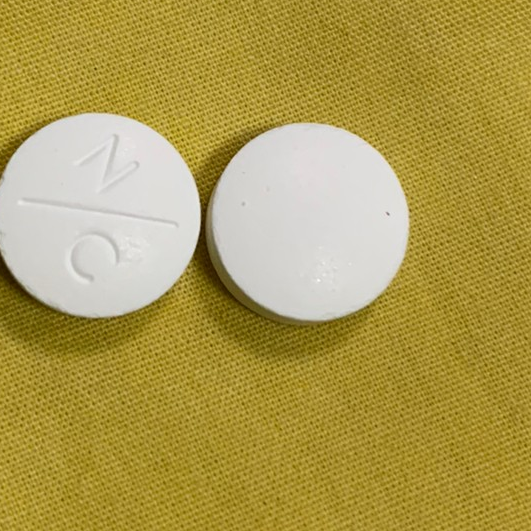

(531, 531, 3)


In [ ]:
crop_image('/content/drive/My Drive/IS/Dataset/รูปที่ใช้ show ตอน Preprocessing/Norgisic_2_200526_0006.jpg')

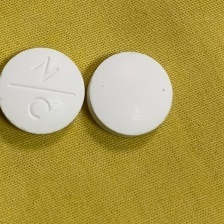

(224, 224, 3)


In [ ]:
resize('/content/drive/My Drive/IS/Dataset/รูปที่ใช้ show ตอน Preprocessing/Norgisic_2_200526_0006.jpg')

In [ ]:
cd ..

/content/drive/My Drive/IS/Dataset/รูปจากผู้ใช้งานจริงล่าสุด


In [ ]:
from tqdm import tqdm_notebook as tqdm
from zipfile import ZipFile
with ZipFile('รูปจากผู้ใช้งานจริง.zip') as zipfile:
     for memory in tqdm(zipfile.infolist(), desc='Extracting'):
         try:
             zipfile.extract(memory,'รูปจากผู้ใช้งานจริงล่าสุด')
         except zipfile.error as e:
             pass

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  after removing the cwd from sys.path.


Process folder 1 / 28 
Process folder : Air-x80
Process img 1 / 3 


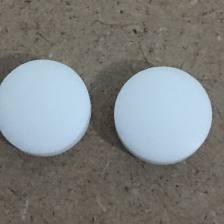

(224, 224, 3)
Process img 2 / 3 


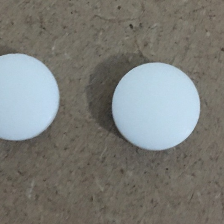

(224, 224, 3)
Process img 3 / 3 


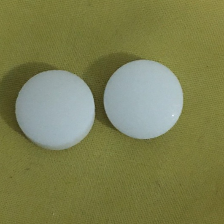

(224, 224, 3)
-----------
Process folder 2 / 28 
Process folder : Amlodipine
Process img 1 / 3 


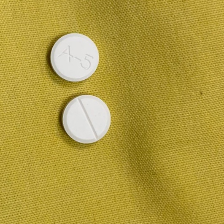

(224, 224, 3)
Process img 2 / 3 


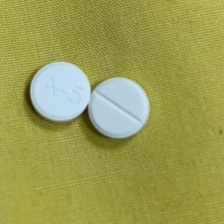

(224, 224, 3)
Process img 3 / 3 


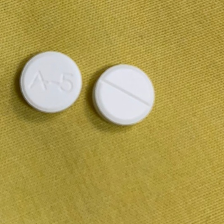

(224, 224, 3)
-----------
Process folder 3 / 28 
Process folder : Betahistine
Process img 1 / 3 


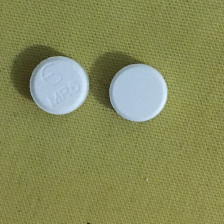

(224, 224, 3)
Process img 2 / 3 


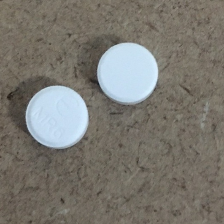

(224, 224, 3)
Process img 3 / 3 


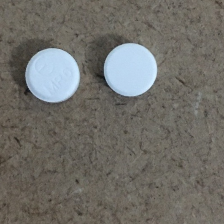

(224, 224, 3)
-----------
Process folder 4 / 28 
Process folder : Betahistine12
Process img 1 / 3 


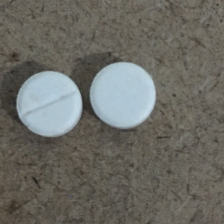

(224, 224, 3)
Process img 2 / 3 


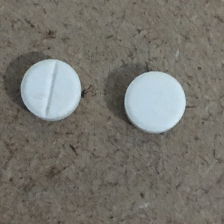

(224, 224, 3)
Process img 3 / 3 


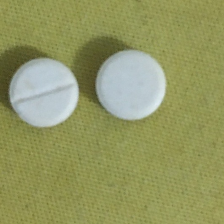

(224, 224, 3)
-----------
Process folder 5 / 28 
Process folder : Caltab
Process img 1 / 3 


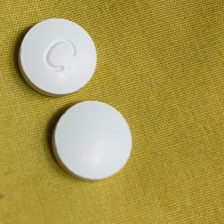

(224, 224, 3)
Process img 2 / 3 


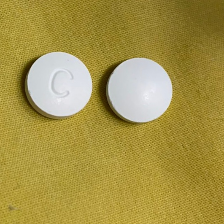

(224, 224, 3)
Process img 3 / 3 


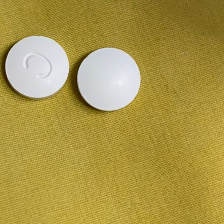

(224, 224, 3)
-----------
Process folder 6 / 28 
Process folder : Celebrex
Process img 1 / 3 


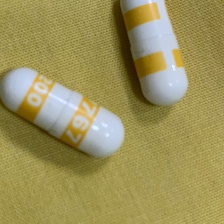

(224, 224, 3)
Process img 2 / 3 


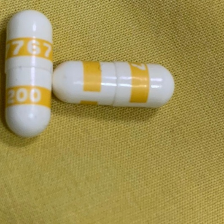

(224, 224, 3)
Process img 3 / 3 


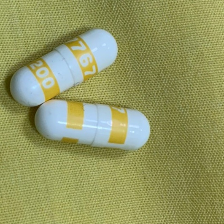

(224, 224, 3)
-----------
Process folder 7 / 28 
Process folder : Cetirizine
Process img 1 / 3 


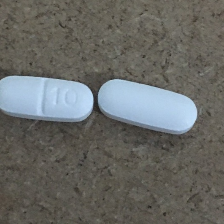

(224, 224, 3)
Process img 2 / 3 


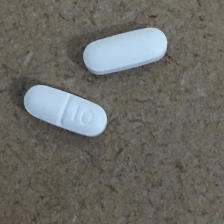

(224, 224, 3)
Process img 3 / 3 


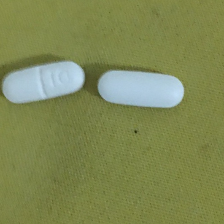

(224, 224, 3)
-----------
Process folder 8 / 28 
Process folder : Cinnarizine
Process img 1 / 3 


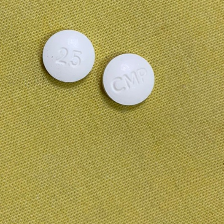

(224, 224, 3)
Process img 2 / 3 


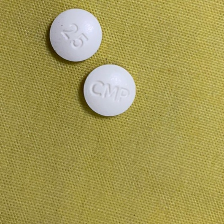

(224, 224, 3)
Process img 3 / 3 


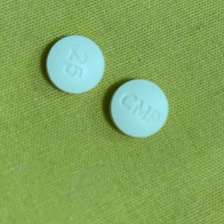

(224, 224, 3)
-----------
Process folder 9 / 28 
Process folder : Cyprohaptadine
Process img 1 / 3 


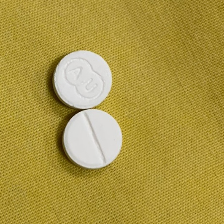

(224, 224, 3)
Process img 2 / 3 


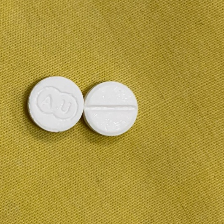

(224, 224, 3)
Process img 3 / 3 


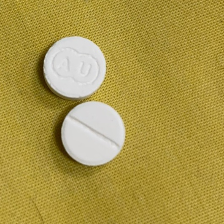

(224, 224, 3)
-----------
Process folder 10 / 28 
Process folder : Diclofinac
Process img 1 / 3 


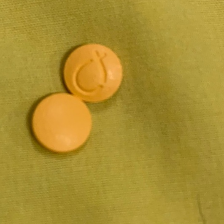

(224, 224, 3)
Process img 2 / 3 


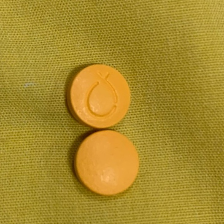

(224, 224, 3)
Process img 3 / 3 


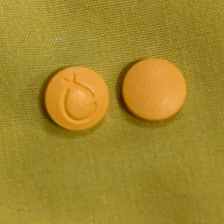

(224, 224, 3)
-----------
Process folder 11 / 28 
Process folder : Diclofinac2
Process img 1 / 3 


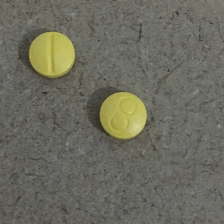

(224, 224, 3)
Process img 2 / 3 


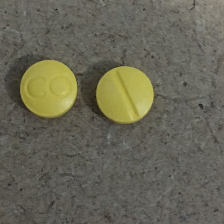

(224, 224, 3)
Process img 3 / 3 


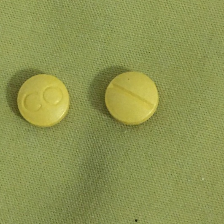

(224, 224, 3)
-----------
Process folder 12 / 28 
Process folder : Dimenhydrinate
Process img 1 / 3 


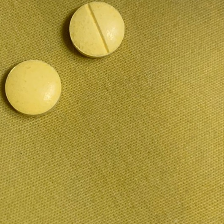

(224, 224, 3)
Process img 2 / 3 


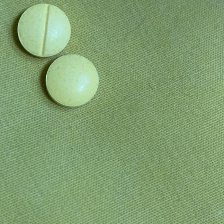

(224, 224, 3)
Process img 3 / 3 


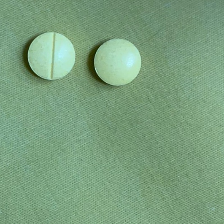

(224, 224, 3)
-----------
Process folder 13 / 28 
Process folder : Domperidone
Process img 1 / 3 


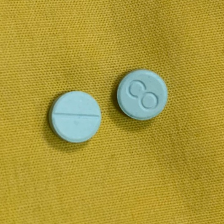

(224, 224, 3)
Process img 2 / 3 


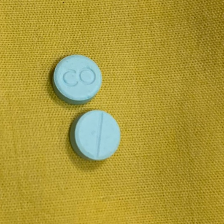

(224, 224, 3)
Process img 3 / 3 


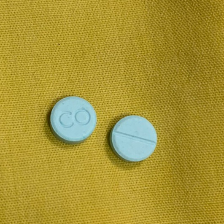

(224, 224, 3)
-----------
Process folder 14 / 28 
Process folder : Dymoxin
Process img 1 / 3 


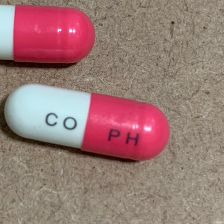

(224, 224, 3)
Process img 2 / 3 


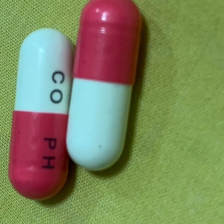

(224, 224, 3)
Process img 3 / 3 


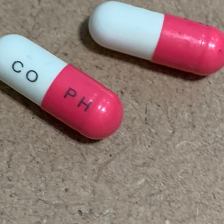

(224, 224, 3)
-----------
Process folder 15 / 28 
Process folder : Ibrofen
Process img 1 / 3 


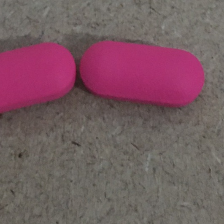

(224, 224, 3)
Process img 2 / 3 


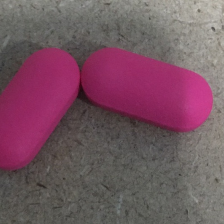

(224, 224, 3)
Process img 3 / 3 


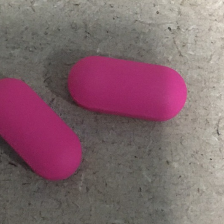

(224, 224, 3)
-----------
Process folder 16 / 28 
Process folder : Ibrupofen
Process img 1 / 3 


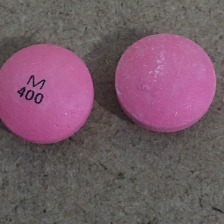

(224, 224, 3)
Process img 2 / 3 


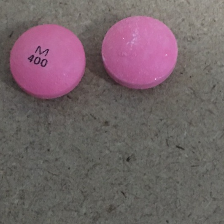

(224, 224, 3)
Process img 3 / 3 


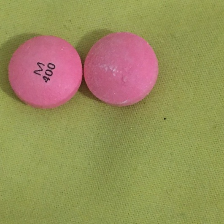

(224, 224, 3)
-----------
Process folder 17 / 28 
Process folder : Ibrupofen2
Process img 1 / 3 


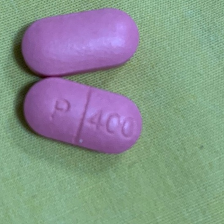

(224, 224, 3)
Process img 2 / 3 


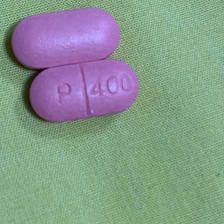

(224, 224, 3)
Process img 3 / 3 


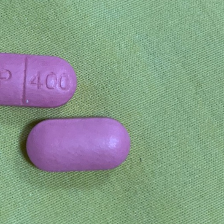

(224, 224, 3)
-----------
Process folder 18 / 28 
Process folder : Losartan
Process img 1 / 3 


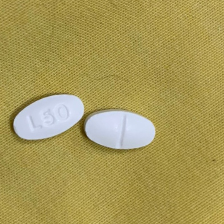

(224, 224, 3)
Process img 2 / 3 


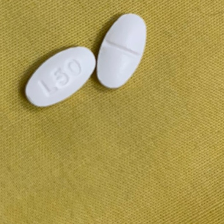

(224, 224, 3)
Process img 3 / 3 


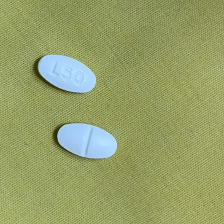

(224, 224, 3)
-----------
Process folder 19 / 28 
Process folder : Methycobal
Process img 1 / 3 


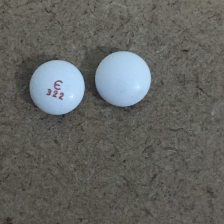

(224, 224, 3)
Process img 2 / 3 


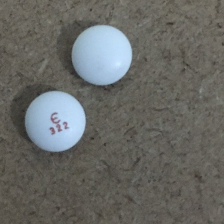

(224, 224, 3)
Process img 3 / 3 


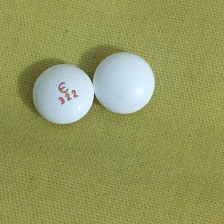

(224, 224, 3)
-----------
Process folder 20 / 28 
Process folder : Metroclopramide
Process img 1 / 3 


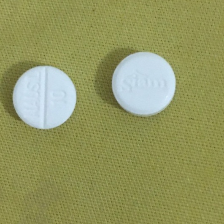

(224, 224, 3)
Process img 2 / 3 


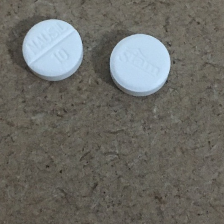

(224, 224, 3)
Process img 3 / 3 


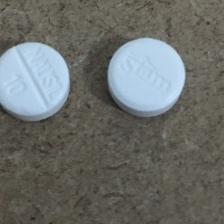

(224, 224, 3)
-----------
Process folder 21 / 28 
Process folder : Nasotap
Process img 1 / 3 


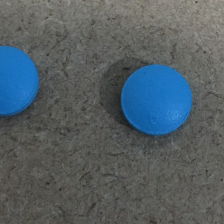

(224, 224, 3)
Process img 2 / 3 


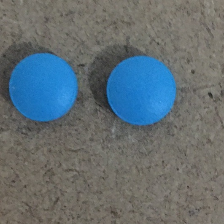

(224, 224, 3)
Process img 3 / 3 


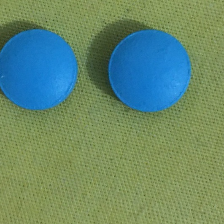

(224, 224, 3)
-----------
Process folder 22 / 28 
Process folder : Norgesic
Process img 1 / 3 


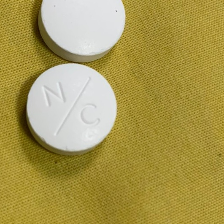

(224, 224, 3)
Process img 2 / 3 


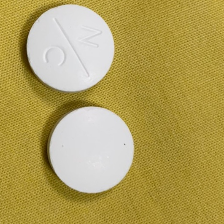

(224, 224, 3)
Process img 3 / 3 


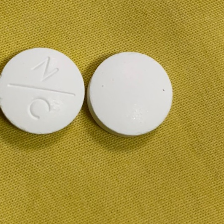

(224, 224, 3)
-----------
Process folder 23 / 28 
Process folder : Nuosic
Process img 1 / 3 


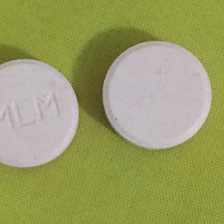

(224, 224, 3)
Process img 2 / 3 


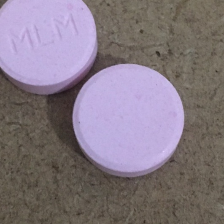

(224, 224, 3)
Process img 3 / 3 


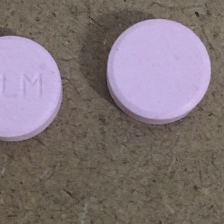

(224, 224, 3)
-----------
Process folder 24 / 28 
Process folder : Omepazole
Process img 1 / 3 


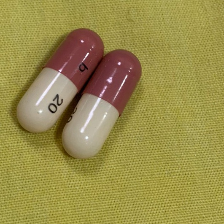

(224, 224, 3)
Process img 2 / 3 


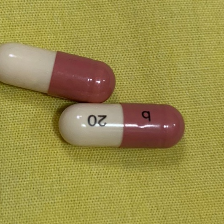

(224, 224, 3)
Process img 3 / 3 


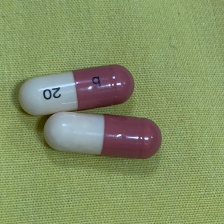

(224, 224, 3)
-----------
Process folder 25 / 28 
Process folder : Pencilin
Process img 1 / 3 


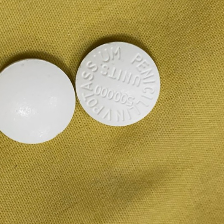

(224, 224, 3)
Process img 2 / 3 


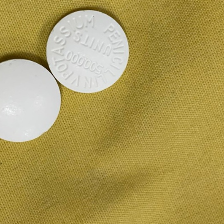

(224, 224, 3)
Process img 3 / 3 


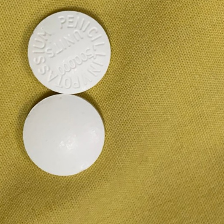

(224, 224, 3)
-----------
Process folder 26 / 28 
Process folder : Tofago
Process img 1 / 3 


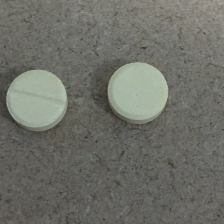

(224, 224, 3)
Process img 2 / 3 


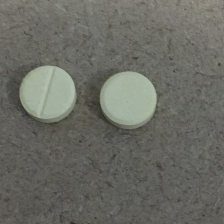

(224, 224, 3)
Process img 3 / 3 


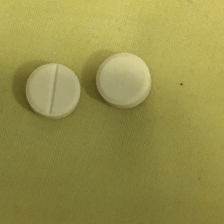

(224, 224, 3)
-----------
Process folder 27 / 28 
Process folder : Tolprisone
Process img 1 / 3 


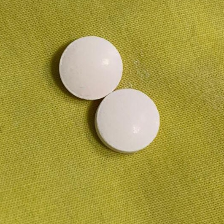

(224, 224, 3)
Process img 2 / 3 


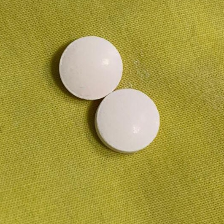

(224, 224, 3)
Process img 3 / 3 


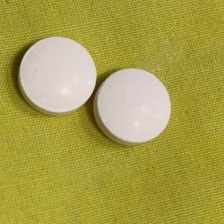

(224, 224, 3)
-----------
Process folder 28 / 28 
Process folder : Torrent
Process img 1 / 3 


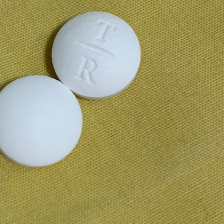

(224, 224, 3)
Process img 2 / 3 


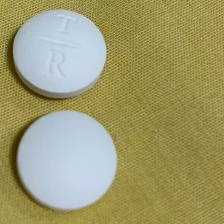

(224, 224, 3)
Process img 3 / 3 


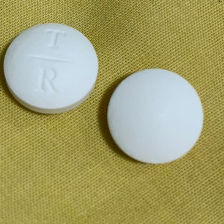

(224, 224, 3)
-----------


In [ ]:
read_path = "รูปจากผู้ใช้งานจริง/*"
read_path_img = "/*.jpg"

folder_count = 0
for folder in glob.glob(read_path):
    folder_count += 1

# Read image all directory
for idx , folder in enumerate(glob.glob(read_path)):
    folder_name = folder.split("/")[1]

    print("Process folder {} / {} ".format(idx+1, folder_count))
    print("Process folder : " + folder_name)
 
    sub_path =  folder + read_path_img
    output_path = "output/"
    output_path = output_path + folder_name

    file_count = 0
    for file in glob.glob(sub_path):
        file_count += 1    

    for idxx , img in enumerate(glob.glob(sub_path)):
      print("Process img {} / {} ".format(idxx+1, file_count))
      crop_image(img)
      resize(img)
 
      print("===================")

    print("-----------")

## Data Augmentation


> โดยเราจะแบ่งข้อมูลเป็น Train/Test แต่ในทางปฏิบัติจริงๆควรจะแบ่งเป็น 3 ส่วนคือ Train/ Validation
ใช้สำหรับฝึกฝนข้อมูลและปรับพารามิเตอร์และมี Test เอาไว้ทดสอบโมเดลจริงๆดังต่อไปนี้

![](https://drive.google.com/uc?export=view&id=1NH0sHkghF_ED1WykvJVeXzl_L_fuQr38)



In [ ]:
## Define image size
image_size = (224,224)

In [ ]:
## function ไว้ plot show ตัว data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from matplotlib.pyplot import imread, imshow, subplots, show


def plot(data_generator):
    data_generator.fit(images)
    image_iterator = data_generator.flow(images)
    
    # Plot the images given by the iterator
    fig, rows = subplots(nrows=1, ncols=4, figsize=(18,18))
    for row in rows:
        row.imshow(image_iterator.next()[0].astype('int'))
        row.axis('off')
    show()
    
image = imread("/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/test/Celebrex/Celebrex  (1).jpg")

# Creating a dataset which contains just one image.
images = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

#imshow(images[0])
#show()





*   shear range





---









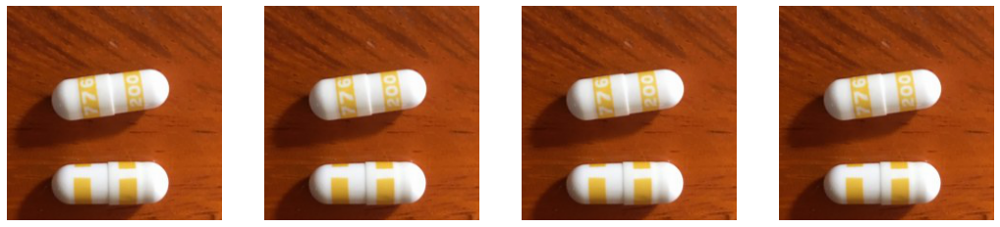

In [ ]:
data_generator = ImageDataGenerator(shear_range=0.2)
plot(data_generator)


* zoom range





---

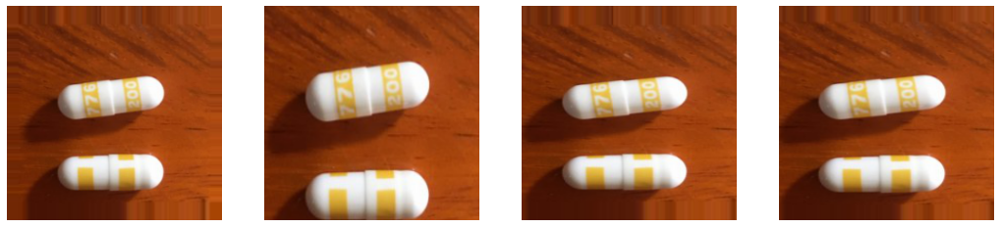

In [ ]:
data_generator = ImageDataGenerator(zoom_range=[0.8,1.2])
plot(data_generator)


* rotation range

---

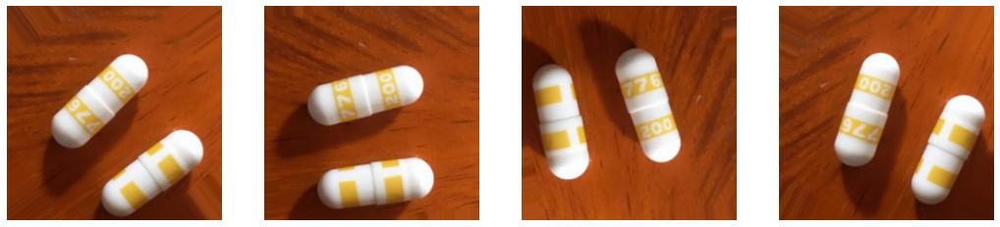

In [ ]:
data_generator = ImageDataGenerator(rotation_range=90)
plot(data_generator)



* brightness range

---









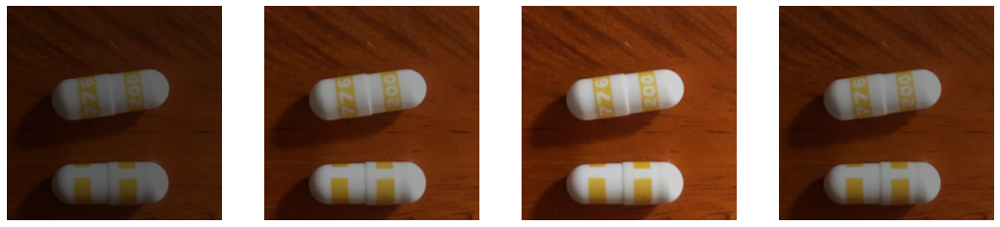

In [ ]:
data_generator = ImageDataGenerator(brightness_range=[0.2,1.0])
plot(data_generator)



* horizontal flip



---











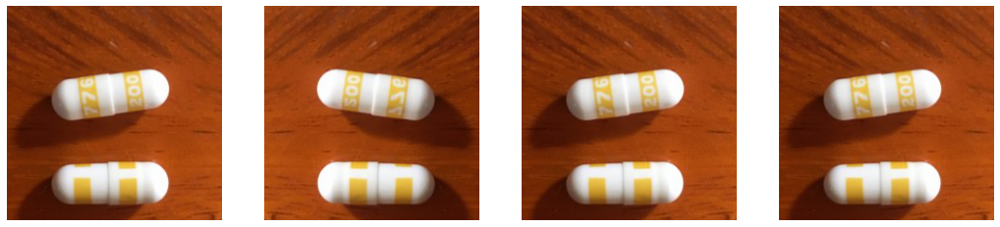

In [ ]:
data_generator = ImageDataGenerator(horizontal_flip=True)
plot(data_generator)



* vertical flip


---









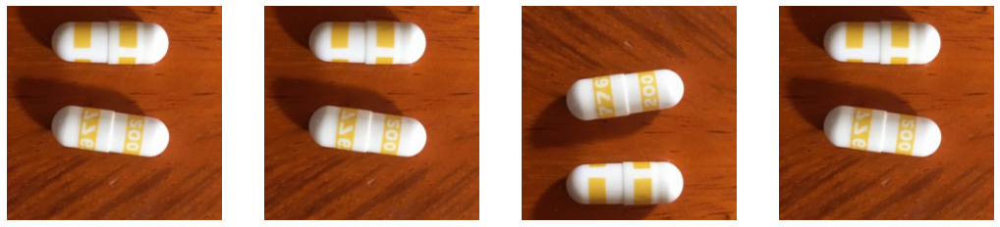

In [ ]:
data_generator = ImageDataGenerator(vertical_flip=True)
plot(data_generator)

* featurewise_center


---

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


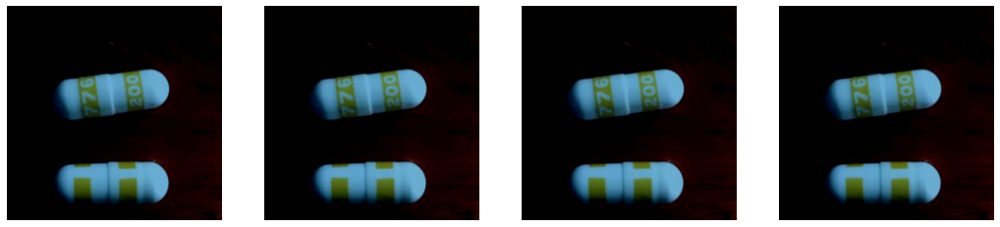

In [ ]:
data_generator = ImageDataGenerator(featurewise_center=True)
plot(data_generator)

In [ ]:
train_datagen = ImageDataGenerator(
        rescale=1./255,
        shear_range=0.2,
        zoom_range=[0.8,1.2],
        rotation_range=90,
        featurewise_center=True,featurewise_std_normalization=True,
        brightness_range=[0.2,1.0],
        horizontal_flip=True,vertical_flip=True,
        validation_split=0.2)



> อันนี้เป็น Data set Train ที่ทำการแยก train กับ Validate



In [ ]:
train_generator = train_datagen.flow_from_directory(
        '/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/train',
        target_size=image_size,
        batch_size=32,
        class_mode='categorical',
        subset='training')

Found 2216 images belonging to 28 classes.


In [ ]:
validation_generator = train_datagen.flow_from_directory(
        '/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/train',
        target_size=image_size,
        batch_size=32,
        class_mode='categorical',
        subset='validation')

Found 544 images belonging to 28 classes.




> อันนี้เป็น data set ของ Test ที่เราทำการแยกไว้ล่วงหน้าแล้ว



In [ ]:
test_datagen = ImageDataGenerator(rescale = 1./255)
test_path = '/content/drive/My Drive/IS/Dataset/Data_update_2/DATASET_pill_update/test'
test_set = test_datagen.flow_from_directory(test_path,
                                            target_size = image_size,
                                            batch_size = 32,
                                            shuffle = False,
                                            class_mode="categorical")

Found 230 images belonging to 28 classes.


## Transfer Learning InceptionResnet50 pretraing model

> Architecture InceptionResnetV2

![](https://miro.medium.com/max/1250/1*xpb6QFQ4IknSmxmgai8w-Q.png)



In [ ]:
base_model = InceptionResNetV2(weights='imagenet', include_top = False, input_shape=(224,224,3))
base_model.summary()

219062272/219055592 [==============================] - 17s 0us/step
Model: "inception_resnet_v2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 111, 111, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 111, 111, 32) 0           batch_normalization_1[0][0]      
____________



> นำโมเดล Pretrained ของ InceptionResnetV2 มาเป็น base Model แล้วนำมาปรับให้เหมาะสมกับ โมเดลที่ต้องการทำนายประเภทของยาทั้งหมด 28 ประเภท โดยนำมา train โมเดลต่อ โดยไม่ได้มีการ freeze 



In [ ]:
## create model ต่อ
x=base_model.output
x=GlobalAveragePooling2D()(x)
x=Dense(1024,activation='relu')(x) 
x=BatchNormalization()(x)
x=Dense(512,activation='relu')(x) 
x=Dropout(0.5)(x)

# predict for 28 class
preds=Dense(28, activation='softmax')(x)

model= Model(inputs=base_model.input,outputs=preds)
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 224, 224, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 111, 111, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 111, 111, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 111, 111, 32) 0           batch_normalization_1[0][0]      
____________________________________________________________________________________________



> โดยในที่นี้เราจะใช้ตัว 

1.   optimizer : adam 
2.   loss : categorical_crossentropy
3.   metrics : accuracy





In [ ]:
model.compile(optimizer=optimizers.Adam(lr=0.00001) ,loss='categorical_crossentropy',metrics=['accuracy'])

 

> ใช้ Ealry stopper มาช่วยในการ save model ในการ train ของแต่ละรอบโดยจะ save weight ค่าที่ที่สุดโดยดูจากค่า Val_loss



In [ ]:
# We'll stop training if no improvement after some epochs
earlystopper1 = EarlyStopping(monitor='val_loss', patience=10, verbose=1)

# Save the best model during the traning
checkpointer1 = ModelCheckpoint('weight.InceptionResnetV2model.h1'
                                ,monitor='val_loss'
                                ,verbose=1
                                ,save_best_only=True
                                ,save_weights_only=True)



> Fit Model



In [ ]:
training=model.fit_generator(
        train_generator,
        steps_per_epoch=train_generator.n // train_generator.batch_size,
        epochs=40,
        validation_data = validation_generator, 
        validation_steps = validation_generator.n//validation_generator.batch_size,
        callbacks=[earlystopper1, checkpointer1]
)

Epoch 1/40


/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.6/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


69/69 [==============================] - 1144s 17s/step - loss: 3.8338 - accuracy: 0.0710 - val_loss: 3.1329 - val_accuracy: 0.0864

Epoch 00001: val_loss improved from inf to 3.13292, saving model to weight.InceptionResnetV2model.h1
Epoch 2/40
69/69 [==============================] - 137s 2s/step - loss: 2.8760 - accuracy: 0.2189 - val_loss: 2.7272 - val_accuracy: 0.2812

Epoch 00002: val_loss improved from 3.13292 to 2.72717, saving model to weight.InceptionResnetV2model.h1
Epoch 3/40
69/69 [==============================] - 137s 2s/step - loss: 2.1702 - accuracy: 0.3883 - val_loss: 2.3664 - val_accuracy: 0.5257

Epoch 00003: val_loss improved from 2.72717 to 2.36635, saving model to weight.InceptionResnetV2model.h1
Epoch 4/40
69/69 [==============================] - 137s 2s/step - loss: 1.5677 - accuracy: 0.5719 - val_loss: 1.5903 - val_accuracy: 0.7206

Epoch 00004: val_loss improved from 2.36635 to 1.59035, saving model to weight.InceptionResnetV2model.h1
Epoch 5/40
69/69 [=======

In [ ]:
metrics = pd.DataFrame(model.history.history)
metrics.head()

,val_loss,val_accuracy,loss,accuracy
0,3.132918,0.086397,3.833568,0.070971
1,2.727171,0.281250,2.880230,0.218864
2,2.366353,0.525735,2.168493,0.388278
3,1.590345,0.720588,1.558583,0.571886
4,1.086076,0.792279,1.145870,0.695055




> ดูจากกราฟค่า loss และ val_loss



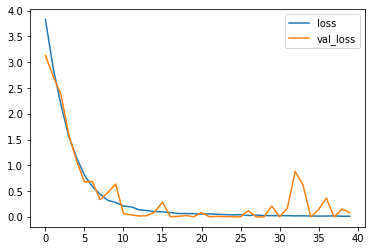

In [ ]:
metrics[['loss', 'val_loss']].plot()



> ดูจากกราฟค่า accuracy , val_accuracy



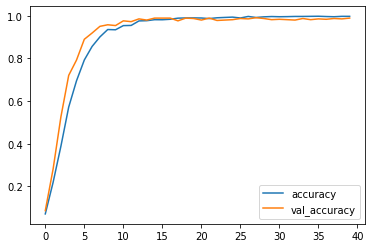

In [ ]:
metrics[['accuracy', 'val_accuracy']].plot()

## save model : VGG16 + train

In [ ]:
model.save('/content/drive/My Drive/IS/Save model/Resnet50/model_InceptionResnet.h5')

## Evaluate model

In [ ]:
labels_index = train_generator.class_indices
labels_index

{'Air-x80': 0,
 'Amlodipine': 1,
 'Betahistine': 2,
 'Betahistine12': 3,
 'Caltab': 4,
 'Celebrex': 5,
 'Cetirizine': 6,
 'Cinnarizine': 7,
 'Cyprohaptadine': 8,
 'Diclofinac': 9,
 'Diclofinac2': 10,
 'Dimenhydrinate': 11,
 'Domperidone': 12,
 'Dymoxin': 13,
 'Ibrofen': 14,
 'Ibrupofen': 15,
 'Ibrupofen2': 16,
 'Losartan': 17,
 'Methycobal': 18,
 'Metroclopramide': 19,
 'Nasotap': 20,
 'Norgesic': 21,
 'Nuosic': 22,
 'Omepazole': 23,
 'Pencilin': 24,
 'Tofago': 25,
 'Tolprisone': 26,
 'Torrent': 27}

In [ ]:
import math
step_size_test=math.ceil(test_set.n/test_set.batch_size)

predictions = model.predict_generator(generator=test_set,
                         steps=step_size_test, 
                         verbose=1)

8/8 [==============================] - 109s 14s/step


In [ ]:
predicted_classes = predictions.argmax(axis=1)
predicted_classes

array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  4,
        4,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,
        6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10, 10, 10,
       10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12,
       12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14,
       14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16,
       16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18,
       18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20,
       20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22,
       22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24,
       24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26,
       26, 27, 27, 27, 27

In [ ]:
true_classes = test_set.classes
true_classes

array([ 0,  0,  0,  0,  0,  0,  0,  0,  1,  1,  1,  1,  1,  1,  1,  1,  1,
        2,  2,  2,  2,  2,  2,  2,  2,  3,  3,  3,  3,  3,  3,  3,  3,  4,
        4,  4,  4,  4,  4,  4,  4,  5,  5,  5,  5,  5,  5,  5,  5,  6,  6,
        6,  6,  6,  6,  6,  6,  7,  7,  7,  7,  7,  7,  7,  7,  8,  8,  8,
        8,  8,  8,  8,  8,  9,  9,  9,  9,  9,  9,  9,  9, 10, 10, 10, 10,
       10, 10, 10, 10, 11, 11, 11, 11, 11, 11, 11, 11, 12, 12, 12, 12, 12,
       12, 12, 12, 13, 13, 13, 13, 13, 13, 13, 13, 13, 14, 14, 14, 14, 14,
       14, 14, 14, 15, 15, 15, 15, 15, 15, 15, 15, 16, 16, 16, 16, 16, 16,
       16, 16, 17, 17, 17, 17, 17, 17, 17, 17, 17, 18, 18, 18, 18, 18, 18,
       18, 18, 18, 19, 19, 19, 19, 19, 19, 19, 19, 20, 20, 20, 20, 20, 20,
       20, 20, 20, 21, 21, 21, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22,
       22, 22, 22, 23, 23, 23, 23, 23, 23, 23, 23, 24, 24, 24, 24, 24, 24,
       24, 24, 25, 25, 25, 25, 25, 25, 25, 25, 26, 26, 26, 26, 26, 26, 26,
       26, 27, 27, 27, 27

Confusion matrix


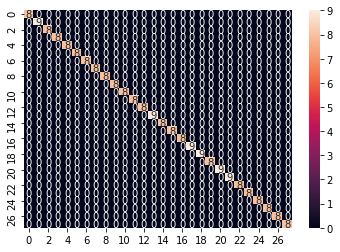

              precision    recall  f1-score   support

           0       1.00      1.00      1.00         8
           1       1.00      1.00      1.00         9
           2       1.00      1.00      1.00         8
           3       1.00      1.00      1.00         8
           4       1.00      1.00      1.00         8
           5       1.00      1.00      1.00         8
           6       1.00      1.00      1.00         8
           7       1.00      1.00      1.00         8
           8       1.00      1.00      1.00         8
           9       1.00      1.00      1.00         8
          10       1.00      1.00      1.00         8
          11       1.00      1.00      1.00         8
          12       1.00      1.00      1.00         8
          13       1.00      1.00      1.00         9
          14       1.00      1.00      1.00         8
          15       1.00      1.00      1.00         8
          16       1.00      1.00      1.00         8
          17       1.00    

In [ ]:
import seaborn as sn
print('Confusion matrix')
cm= confusion_matrix(true_classes, predicted_classes)
#print(cm)

sn.heatmap(cm, annot=True)
plt.show()

report = classification_report(true_classes, predicted_classes)
print(report) 

## แสดงรูปที่มีการทำนายผิด

In [ ]:
for i in range(step_size_test):
    X_test, y_test = test_set.next()
    preds = model.predict(X_test) 
    predclass = np.argmax(preds,axis=1)
    trueclass = np.argmax(y_test,axis=1)
    
    labels_name = list(test_set.class_indices.keys())
    plt.figure(1 , figsize = (12 , 6))
    for i in range(len(y_test)):
        pred_class = predclass[i]
        prediction = labels_name[pred_class]
        label = labels_name[trueclass[i]]
        if (label != prediction):
            image = X_test[i].reshape([224,224,3])
        # plt.subplot(4 ,3 , i)
            plt.title('Prediction: {:}  Label: {:}'.format(prediction, label))
            plt.imshow(image) 
            plt.xticks([]) , plt.yticks([])

    plt.show()

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

<Figure size 864x432 with 0 Axes>

In [ ]:
from keras.preprocessing import image
from keras.preprocessing.image import img_to_array, array_to_img

def Test_Pill_identification(path):
    test_image = image.load_img(path, target_size = (224,224))
    plt.imshow(test_image)
    plt.show()
    test_image = image.img_to_array(test_image)
    test_image = np.expand_dims(test_image/255.0, axis = 0)
    result = model.predict(test_image)
    print("Air-x80        :   {:.4f}".format(result[0][0]))
    print("Amlodipine     :   {:.4f}".format(result[0][1]))
    print("Betahistine    :   {:.4f}".format(result[0][2]))
    print("Betahistine2   :   {:.4f}".format(result[0][3]))
    print("Caltab         :   {:.4f}".format(result[0][4]))
    print("Celebrex       :   {:.4f}".format(result[0][5]))
    print("Cetirizine     :   {:.4f}".format(result[0][6]))
    print("Cinnarizine    :   {:.4f}".format(result[0][7]))
    print("Cyprohaptadine :   {:.4f}".format(result[0][8]))
    print("Dicrofenac     :   {:.4f}".format(result[0][9]))
    print("Dicrofenac_2   :   {:.4f}".format(result[0][10]))
    print("Dimenhydrinate :   {:.4f}".format(result[0][11]))
    print("Domperidone    :   {:.4f}".format(result[0][12]))
    print("Dymoxin        :   {:.4f}".format(result[0][13]))
    print("Ibrofen        :   {:.4f}".format(result[0][14]))
    print("Ibrupofen      :   {:.4f}".format(result[0][15]))
    print("Ibrupofen2     :   {:.4f}".format(result[0][16]))
    print("Losartan       :   {:.4f}".format(result[0][17]))
    print("Methycobal     :   {:.4f}".format(result[0][18]))
    print("Metroclopramide:   {:.4f}".format(result[0][19]))
    print("Nasotap        :   {:.4f}".format(result[0][20]))
    print("Norgesic       :   {:.4f}".format(result[0][21]))
    print("Nuosic         :   {:.4f}".format(result[0][22]))
    print("Omepazole      :   {:.4f}".format(result[0][23]))
    print("Pencilin       :   {:.4f}".format(result[0][24]))
    print("Tofago         :   {:.4f}".format(result[0][25]))
    print("Tolprisone     :   {:.4f}".format(result[0][26]))
    print("Torrent        :   {:.4f}".format(result[0][27]))

## นำรูปมาทดสอบ model InceptionResnetV2 จากภาพถ่ายของผู้ทดลองใช้งานจริง

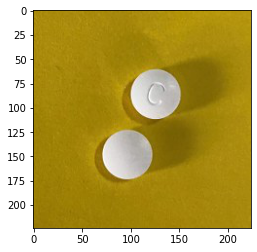

Air-x80        :   0.0000
Amlodipine     :   0.0000
Betahistine    :   0.0000
Betahistine2   :   0.0000
Caltab         :   1.0000
Celebrex       :   0.0000
Cetirizine     :   0.0000
Cinnarizine    :   0.0000
Cyprohaptadine :   0.0000
Dicrofenac     :   0.0000
Dicrofenac_2   :   0.0000
Dimenhydrinate :   0.0000
Domperidone    :   0.0000
Dymoxin        :   0.0000
Ibrofen        :   0.0000
Ibrupofen      :   0.0000
Ibrupofen2     :   0.0000
Losartan       :   0.0000
Methycobal     :   0.0000
Metroclopramide:   0.0000
Nasotap        :   0.0000
Norgesic       :   0.0000
Nuosic         :   0.0000
Omepazole      :   0.0000
Pencilin       :   0.0000
Tofago         :   0.0000
Tolprisone     :   0.0000
Torrent        :   0.0000


In [ ]:
Test_Pill_identification('/content/drive/My Drive/IS/Dataset/Pill_dataset_resize/test/Caltab/Caltab  (2).jpg')

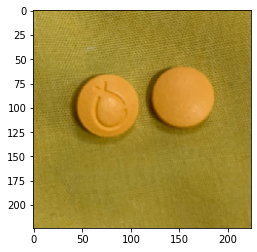

Air-x80        :   0.0001
Amlodipine     :   0.0000
Betahistine    :   0.0001
Betahistine2   :   0.0000
Caltab         :   0.0002
Celebrex       :   0.0000
Cetirizine     :   0.0000
Cinnarizine    :   0.0000
Cyprohaptadine :   0.0000
Dicrofenac     :   0.9976
Dicrofenac_2   :   0.0011
Dimenhydrinate :   0.0001
Domperidone    :   0.0000
Dymoxin        :   0.0000
Ibrofen        :   0.0000
Ibrupofen      :   0.0000
Ibrupofen2     :   0.0000
Losartan       :   0.0000
Methycobal     :   0.0001
Metroclopramide:   0.0000
Nasotap        :   0.0000
Norgesic       :   0.0000
Nuosic         :   0.0000
Omepazole      :   0.0000
Pencilin       :   0.0002
Tofago         :   0.0002
Tolprisone     :   0.0000
Torrent        :   0.0002


In [ ]:
Test_Pill_identification('/content/drive/My Drive/IS/Dataset/รูปจากผู้ใช้งานจริงทั้ง 1 side และ 2 side/Diclofinac/Diclofenac_t2_200526_0006.jpg')

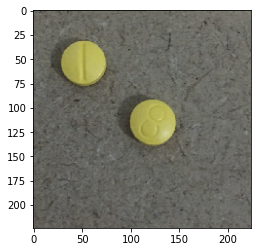

Air-x80        :   0.0000
Amlodipine     :   0.0000
Betahistine    :   0.0000
Betahistine2   :   0.0000
Caltab         :   0.0000
Celebrex       :   0.0000
Cetirizine     :   0.0000
Cinnarizine    :   0.0000
Cyprohaptadine :   0.0000
Dicrofenac     :   0.0001
Dicrofenac_2   :   0.9993
Dimenhydrinate :   0.0000
Domperidone    :   0.0002
Dymoxin        :   0.0000
Ibrofen        :   0.0000
Ibrupofen      :   0.0000
Ibrupofen2     :   0.0002
Losartan       :   0.0000
Methycobal     :   0.0000
Metroclopramide:   0.0000
Nasotap        :   0.0000
Norgesic       :   0.0000
Nuosic         :   0.0000
Omepazole      :   0.0000
Pencilin       :   0.0000
Tofago         :   0.0000
Tolprisone     :   0.0000
Torrent        :   0.0000


In [ ]:
Test_Pill_identification('/content/drive/My Drive/IS/Dataset/รูปจากผู้ใช้งานจริงทั้ง 1 side และ 2 side/Diclofinac2/Diclofenac2_t2_200526_0001.jpg')

## ทดลองกับรูปที่ถ่ายจากผู้ใช้งานจริง


> เราต้องทำการ preprocess ก่อนที่จะนำไปทดสอบโมเดล จากตอนแรกที่พบปัญหาคือผู้ใช้งานถ่ายรูปที่มีระยะที่ไกลเกินไป เมื่อเรานำไปทดสอบพบว่าเกิดปัญหาที่ทำให้ทำนาย ชนิดยาผิด ดังนั้น เราได้ทำการ Crop และ Resize image ก่อน โดยการ Crop จะเลือกพื้นที่ ROI



In [ ]:
test_datagen2 = ImageDataGenerator(rescale = 1./255)
test_path2 = '/content/drive/My Drive/IS/Dataset/รูปจากผู้ใช้งานจริงล่าสุด/รูปจากผู้ใช้งานจริง'
test_set2 = test_datagen2.flow_from_directory(test_path2,
                                            target_size = image_size,
                                            batch_size = 32,
                                            shuffle = False,
                                            class_mode="categorical")

Found 84 images belonging to 28 classes.


In [ ]:
import math
step_size_test2=math.ceil(test_set2.n/test_set2.batch_size)

predictions_2 = model.predict_generator(generator=test_set2,
                         steps=step_size_test2, 
                         verbose=1)

3/3 [==============================] - 28s 9s/step


In [ ]:
predicted_classes2 = predictions_2.argmax(axis=1)
predicted_classes2

array([ 0,  0,  0,  1,  1,  1,  2,  2,  2, 25, 25, 25,  4,  4,  4,  5,  5,
        5,  6,  6,  6,  7,  7,  7,  8,  8,  8,  9,  9,  9, 10, 10, 10, 25,
       25, 25, 12, 12, 12, 13, 23, 23, 14, 14, 14, 15, 15, 15, 16, 16, 16,
       17, 17, 17, 18, 18, 18,  1, 19, 19, 20, 20, 20, 21, 21,  1, 22, 22,
       22, 23, 23, 23, 24, 24, 24, 25, 25, 25,  0,  0, 25, 27,  1,  1])

In [ ]:
true_classes2 = test_set2.classes
true_classes2

array([ 0,  0,  0,  1,  1,  1,  2,  2,  2,  3,  3,  3,  4,  4,  4,  5,  5,
        5,  6,  6,  6,  7,  7,  7,  8,  8,  8,  9,  9,  9, 10, 10, 10, 11,
       11, 11, 12, 12, 12, 13, 13, 13, 14, 14, 14, 15, 15, 15, 16, 16, 16,
       17, 17, 17, 18, 18, 18, 19, 19, 19, 20, 20, 20, 21, 21, 21, 22, 22,
       22, 23, 23, 23, 24, 24, 24, 25, 25, 25, 26, 26, 26, 27, 27, 27],
      dtype=int32)

Confusion matrix


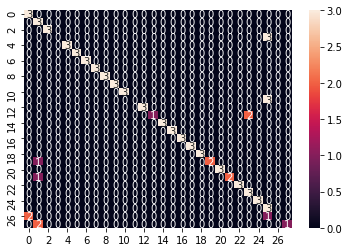

              precision    recall  f1-score   support

           0       0.60      1.00      0.75         3
           1       0.43      1.00      0.60         3
           2       1.00      1.00      1.00         3
           3       0.00      0.00      0.00         3
           4       1.00      1.00      1.00         3
           5       1.00      1.00      1.00         3
           6       1.00      1.00      1.00         3
           7       1.00      1.00      1.00         3
           8       1.00      1.00      1.00         3
           9       1.00      1.00      1.00         3
          10       1.00      1.00      1.00         3
          11       0.00      0.00      0.00         3
          12       1.00      1.00      1.00         3
          13       1.00      0.33      0.50         3
          14       1.00      1.00      1.00         3
          15       1.00      1.00      1.00         3
          16       1.00      1.00      1.00         3
          17       1.00    

/usr/local/lib/python3.6/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print('Confusion matrix')
cm2= confusion_matrix(true_classes2, predicted_classes2)
sn.heatmap(cm2, annot=True)
plt.show()
report2 = classification_report(true_classes2, predicted_classes2)
print(report2)  

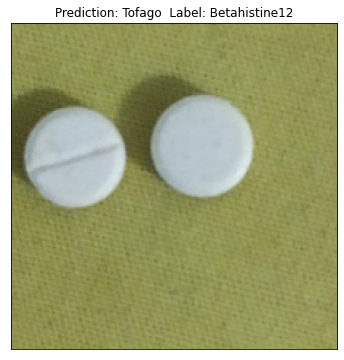

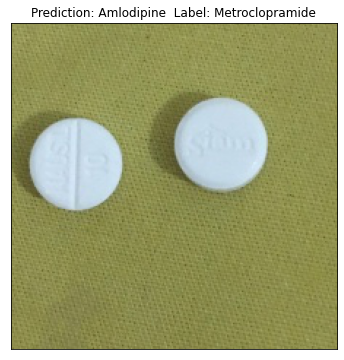

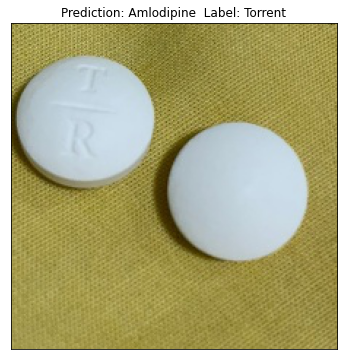

In [ ]:
for i in range(step_size_test2):
    X_test, y_test = test_set2.next()
    preds = model.predict(X_test) 
    predclass2 = np.argmax(preds,axis=1)
    trueclass2 = np.argmax(y_test,axis=1)
    
    labels_name2 = list(test_set2.class_indices.keys())
    plt.figure(1 , figsize = (12 , 6))
    for i in range(len(y_test)):
        pred_class = predclass2[i]
        prediction2 = labels_name2[pred_class]
        label2 = labels_name2[trueclass2[i]]
        if (label2 != prediction2):
            image = X_test[i].reshape([224,224,3])
        # plt.subplot(4 ,3 , i)
            plt.title('Prediction: {:}  Label: {:}'.format(prediction2, label2))
            plt.imshow(image) 
            plt.xticks([]) , plt.yticks([])

    plt.show()